In [5]:
# Import main packages
import sys, os
sys.path.insert(1, os.path.abspath('..') )
from ECO import diagnostics as eco
from ECO.utils import config_parser, open_datasets, get_namelist
import xarray as xr
import xgcm
import numpy as np

# Import matplotlib for plotting and functions to override default values
import matplotlib.pyplot as plt
from plot_utils import update_plotstyle, cmap_OB
cmap_OB=cmap_OB(); update_plotstyle()

In [10]:
exp_prefix = ['EXP00','EXP01'] # Import all files with this prefix
exp_suffix = ['_rest6m2000_1','_rest6m2000_1']
ds = open_datasets(exp_prefix, exp_suffix, components = ['postprocessed','metrics', 'masks','properties','moc'])
if type(ds) != dict: 
    ds={exp_prefix+exp_suffix:ds}
exp_names = [exp_prefix[i]+exp_suffix[i] for i in range(len(exp_prefix))]

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

In [11]:
%matplotlib inline
# get base configuration of EXP00
kwargs={}
#kwargs[exp_prefix+exp_suffix] = config_parser(exp_prefix)
for i in range(len(exp_prefix)): kwargs[exp_prefix[i]+exp_suffix[i]] = config_parser(exp_prefix[i], exp_suffix=exp_suffix[i])
#for exp in exp_suffix: kwargs[exp_prefix+exp] = config_parser(exp_prefix)
#if kwargs_sim['get_namelist']: kwargs_sim['namelist'] = get_namelist(path = kwargs_proc['path_nemo'])

# define xgcm configuration based on dataset metrics
_metrics = {('X',): ['e1tm', 'e1um', 'e1vm', 'e1fm'],
     ('Y',): ['e2tm', 'e2um', 'e2vm', 'e2fm'],
     ('Z',): ['e3tm', 'e3um', 'e3vm', 'e3wm']}

grid = {exp: xgcm.Grid(ds[exp], metrics=_metrics, periodic=False) for exp in ds} # define xgcm grid
grid_ops = {exp: eco.Grid_ops(grid[exp], maskargs={'mask':'nan'}) for exp in ds} # define gridoperations.
grid = {exp: grid_ops[exp]._update({'Z':ds[exp]['e3tm_1d']}) for exp in ds}
        
properties= {exp: eco.Properties(grid_ops[exp], {'X': ds[exp].glamt, 'Y': ds[exp].gphit, 'Z': ds[exp].depth_1d}, eos_properties=kwargs[exp][2]['eos']) for exp in ds}
energetics= {exp: eco.Energetics(grid_ops[exp], properties[exp]) for exp in ds}


exp0 = 'EXP00_rest6m2000_1'
exp1 = 'EXP01_rest6m2000_1'
dt=ds[exp0].t.diff('t')[0]/86400/360
t_years=np.arange(1,(len(ds[exp0].t)+2)*dt,dt)

Update processing configuration with subconfig_rest6m2000_1
Update processing configuration with subconfig_rest6m2000_1


In [12]:
zg =   {exp: ds[exp].zgDE for exp in ds}
zg0 =   {exp: ds[exp].zgDE_gm for exp in ds}
for exp in ds: zg[exp][0]=0; zg0[exp][0]=0

magn=1e9
tendency_correction = {}
tendency_correction1 = {}
for exp in ds:
    
    KN2_convective =ds[exp]['KN2_convective_gm']*magn
    KN2_diffusive = (ds[exp]['KN2_diffusive_gm']+ds[exp]['Gh_surf_gm']+ds[exp]['Gh_hdiff_gm']+ds[exp]['Gh_qsr_gm'])*magn
    C = ds[exp]['C_gm']*magn
    tendency_correction[exp] = zg[exp].differentiate('t')*magn - (KN2_convective + KN2_diffusive + C)
    tendency_correction1[exp] = zg[exp] - (KN2_convective + KN2_diffusive + C).cumsum('t')*60*60*24*180/magn

In [19]:
#vars = ['KN2_convective','KN2_diffusive','C']#'Gh_surf','Gh_hdiff','Gh_qsr','C']
magn=1e9
print("Mean of timeslices")
print('Convection  Diffusion  Conversion')
for exp in ds:
    # vars = {}
    # vars['Convection'] = - properties[exp].global_mean(ds[exp]['KN2_convective'], Vmask=ds[exp].mask_bd_w)
    # vars['Diffusion'] = (- properties[exp].global_mean(ds[exp]['KN2_diffusive'], Vmask=ds[exp].mask_bd_w) 
    # + ds[exp]['Gh_surf'] 
    # + properties[exp].global_mean(ds[exp]['Gh_hdiff'],Vmask=ds[exp].mask_bd_t )
    # + properties[exp].global_mean(ds[exp]['Gh_qsr'],Vmask=ds[exp].mask_bd_t ))
    # vars['Conversion'] = properties[exp].global_mean(ds[exp]['C'],Vmask=ds[exp].mask_bd_t )
    print('-----------------')
    print(exp)
    # for var in vars:
    #print(var, '[1e-9m/s]')
    time_means = []
    for time in [(0,40), (40,800), (800,4100)]:
        #time_means.append(vars[var][slice(*time)].mean('t').values*magn)
        print('{}-{}: {:.4f}  {:.4f}  {:.4f}'.format(int(time[0]/2),int(time[1]/2),
                                                ds[exp]['KN2_convective_gm'][slice(*time)].mean('t').values*magn,
                                                (ds[exp]['KN2_diffusive_gm']+ds[exp]['Gh_surf_gm']+ds[exp]['Gh_hdiff_gm']+ds[exp]['Gh_qsr_gm'])[slice(*time)].mean('t').values*magn,
                                                ds[exp]['C_gm'][slice(*time)].mean('t').values*magn))
    

Mean of timeslices
Convection  Diffusion  Conversion
-----------------
EXP00_rest6m2000_1
0-20: -0.9646  1.1957  -0.7856
20-400: -0.0803  0.1488  -0.0805


400-2050: -0.0165  0.0244  -0.0082
-----------------
EXP01_rest6m2000_1
0-20: -0.9471  1.2011  -0.8093
20-400: -0.0728  0.1581  -0.0954
400-2050: -0.0134  0.0301  -0.0165


In [7]:
exp0 = 'EXP00_rest6m2000_1'
p=properties[exp0]
dh_T = p.dh_T(ds[exp0].to,ds[exp0].so,ds[exp0].depth,Z_r=ds[exp0].zg_0).compute()
dh_S = p.dh_S(ds[exp0].to,ds[exp0].so,ds[exp0].depth,Z_r=ds[exp0].zg_0).compute()
dhTdz = p.global_mean(grid[exp0].derivative(dh_T,'Z',boundary='fill',fill_value=0),Vmask=ds[exp0].mask_bd_t).compute()
# dhSdz = p.global_mean(grid[exp0].derivative(dh_S,'Z',boundary='fill',fill_value=0),Vmask=ds[exp0].mask_bd_t).compute()
dhTz = p.global_mean(p.dh_TZ(ds[exp0].to,ds[exp0].so,ds[exp0].depth),Vmask=ds[exp0].mask_bd_t).compute()
# dhSz = p.global_mean(p.dh_SZ(ds[exp0].to,ds[exp0].so,ds[exp0].depth),Vmask=ds[exp0].mask_bd_t).compute()

/proj/climategu/users/x_bensc/Analysis/venv/lib/python3.10/site-packages/xgcm/grid_ufunc.py:832: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  out_dim: grid._ds.dims[out_dim] for arg in out_core_dims for out_dim in arg


In [8]:
plt.plot(t_years,p.global_mean(dhTdz,Vmask=ds[exp0].mask_bd_t).compute())
plt.plot(t_years,p.global_mean(dhTz,Vmask=ds[exp0].mask_bd_t).compute())


: 

In [23]:
dhdt={}
for exp in ds:
    ds[exp]['to_s'][0]=ds[exp]['to_s'][1]-(ds[exp]['to_s'][1]-10)/2
    ds[exp]['so_s'][0]=ds[exp]['so_s'][1]-(ds[exp]['so_s'][1]-35)/2
    dTdt = ds[exp]['to_s'].differentiate('t')
    dSdt = ds[exp]['so_s'].differentiate('t')
    hT0 = properties[exp].dh_T(ds[exp]['to_s'], ds[exp]['so_s'], ds[exp]['depth'], Z_r=ds[exp]['zg_0'])
    hS0 = properties[exp].dh_S(ds[exp]['to_s'], ds[exp]['so_s'], ds[exp]['depth'], Z_r=ds[exp]['zg_0'])

    dhdt[exp] = (properties[exp].global_mean(hT0*dTdt+hS0*dSdt,Vmask=ds[exp].mask_bd_t)/9.81).compute()

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

In [13]:
thermobaric_correction={}
for exp in ds:
    ds[exp]['to_s'][0]=ds[exp]['to_s'][1]-(ds[exp]['to_s'][1]-10)/2
    dTdt = properties[exp].global_mean(ds[exp]['to_s'].differentiate('t'),Vmask=ds[exp].mask_bd_t)
    hT0 = properties[exp].dh_T(ds[exp]['t_gm'], ds[exp]['s_gm'], ds[exp]['depth'], Z_r=ds[exp]['zg_0'])
    hT0_gm = properties[exp].global_mean(hT0,Vmask=ds[exp].mask_bd_t)

    thermobaric_correction[exp] = (hT0_gm*dTdt/9.81).compute()
    thermobaric_correction[exp][0] *= np.nan

In [11]:
magn=1e9
for exp in ds:
    print('-----------------')
    print(exp)
    time_means = []
    for time in [(0,40), (40,800), (800,4100)]:
        #time_means.append(vars[var][slice(*time)].mean('t').values*magn)
        print('{}-{}: {:.4f}'.format(int(time[0]/2),int(time[1]/2),thermobaric_correction[exp][slice(*time)].mean('t').values*magn))

-----------------
EXP00_rest6m2000_1
0-20: -0.0427
20-400: -0.0069
400-2050: 0.0000
-----------------
EXP01_rest6m2000_1
0-20: -0.0428
20-400: -0.0069
400-2050: 0.0000


In [6]:
zg =   {exp: ds[exp].zgDE.rolling({'t':2}).mean('t') for exp in ds}
zg0 =   {exp: ds[exp].zgDE_gm.rolling({'t':2}).mean('t') for exp in ds}
for exp in ds: zg[exp][0]=0; zg0[exp][0]=0

In [12]:
magn=1e9
tendency_correction = {}
for exp in ds:
    
    KN2_convective =ds[exp]['KN2_convective_gm']*magn
    KN2_diffusive = (ds[exp]['KN2_diffusive_gm']+ds[exp]['Gh_surf_gm']+ds[exp]['Gh_hdiff_gm']+ds[exp]['Gh_qsr_gm'])*magn
    C = ds[exp]['C_gm']*magn
    tendency_correction[exp] = zg[exp] - (KN2_convective + KN2_diffusive + C).cumsum('t')*60*60*24*180/magn

In [53]:
magn=1e9
for exp in ds:
    print('-----------------')
    print(exp)
    time_means = []
    for time in [(0,10), (10,40), (40,800), (800,4100)]:
        #time_means.append(vars[var][slice(*time)].mean('t').values*magn)
        tot_dif = (ds[exp]['KN2_diffusive_gm']+ds[exp]['Gh_surf_gm']+ds[exp]['Gh_hdiff_gm']+ds[exp]['Gh_qsr_gm'])*magn + tendency_correction[exp]
        tot = tot_dif+(ds[exp]['KN2_convective_gm']+ds[exp]['C_gm'])*magn - thermobaric_correction[exp]*magn
        print('{}-{}: {:.4f} {:.4f} {:.4f} {:.4f} {:.4f}'.format(int(time[0]/2),
                                            int(time[1]/2),
                                            tot_dif[slice(*time)].mean('t').values,
                                            ds[exp]['KN2_convective_gm'][slice(*time)].mean('t').values*magn,
                                            ds[exp]['C_gm'][slice(*time)].mean('t').values*magn,
                                            -thermobaric_correction[exp][slice(*time)].mean('t').values*magn,
                                            tot[slice(*time)].mean('t').values))

-----------------
EXP00_rest6m2000_1
0-5: 1.4001 -1.8788 -0.5156 0.0339 -0.9605
5-20: 1.2474 -0.6903 -0.8666 0.0453 -0.2642
20-400: 0.1558 -0.0803 -0.0805 0.0069 0.0019
400-2050: 0.0245 -0.0165 -0.0082 -0.0000 -0.0002
-----------------
EXP01_rest6m2000_1
0-5: 1.4456 -1.8511 -0.5354 0.0365 -0.9045
5-20: 1.2389 -0.6759 -0.8914 0.0447 -0.2838
20-400: 0.1655 -0.0728 -0.0954 0.0069 0.0041
400-2050: 0.0297 -0.0134 -0.0165 -0.0000 -0.0002


In [49]:
-0.96464+1.2826-0.7856+0.0427

-0.42494000000000004

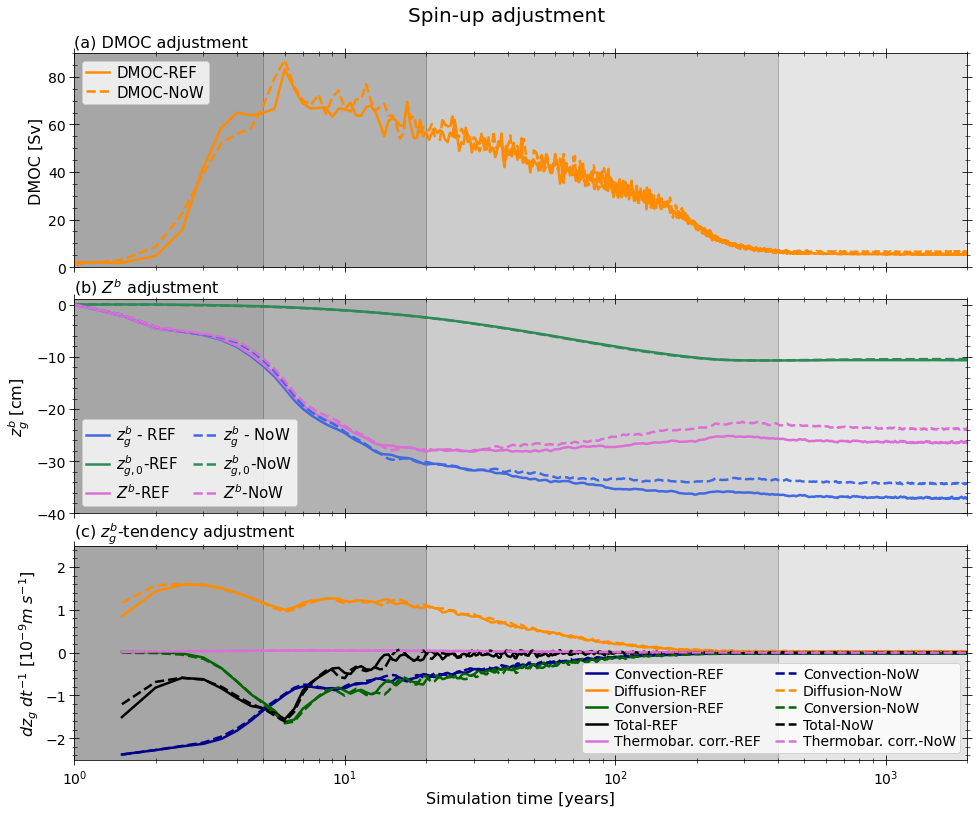

In [17]:
%matplotlib inline
from statsmodels.nonparametric.smoothers_lowess import lowess

fig,ax = plt.subplots(3,figsize=(16,13))
for i, time in enumerate([[0,90],[-40,1],[-2.5,2.5]]):
    ax[i].fill_between([0,5], time[0], time[1],alpha=0.7,color='grey')
    ax[i].fill_between([5,20], time[0], time[1],alpha=0.6,color='grey')
    ax[i].fill_between([20,400], time[0], time[1],alpha=0.4,color='grey')
    ax[i].fill_between([400,3000], time[0], time[1],alpha=0.2,color='grey')

    ax[i].set_xscale('log')
    ax[i].set_xlim(1,2e3)
    ax[i].set_ylim(time[0], time[1])
    if i<2: ax[i].set_xticklabels([])
    ax[i].tick_params(top=True, right=True, which='both')
    if i==2: ax[i].set_xlabel('Simulation time [years]',fontsize=16)

plt.subplots_adjust(hspace=0.15)
fig.suptitle('Spin-up adjustment',fontsize=20,y=0.93)
ax[0].set_title("(a) DMOC adjustment",fontsize=16, loc='left')
ax[1].set_title("(b) $z_g^b$ adjustment",fontsize=16, loc='left')
ax[2].set_title("(c) $z_g^b$-tendency adjustment",fontsize=16, loc='left')

exp0 = 'EXP00_rest6m2000_1'
exp1 = 'EXP01_rest6m2000_1'

# DMOC
dt=ds['EXP00_rest6m2000_1'].t.diff('t')[0]/86400/360
t_years=np.arange(1,(len(ds['EXP00_rest6m2000_1'].t)+2)*dt,dt)
dmoc = {exp: np.transpose(lowess(ds[exp].psi_dmoc.values, ds[exp].t,frac=0.001))[1] for exp in ds}
ax[0].plot(t_years,dmoc[exp0],c='Darkorange',label='DMOC-REF')
ax[0].plot(t_years,dmoc[exp1],c='Darkorange',linestyle='--',label='DMOC-NoW')
ax[0].legend(fontsize=15,loc='upper left',borderpad=0.3,handlelength=1.5,handletextpad=0.5,labelspacing=0.3)
ax[0].set_ylabel('DMOC [Sv]',fontsize=16)

# Zg
zg =   {exp: ds[exp].zgDE.rolling({'t':2}).mean('t') for exp in ds}
zg0 =   {exp: ds[exp].zgDE_gm.rolling({'t':2}).mean('t') for exp in ds}
for exp in ds: zg[exp][0]=0; zg0[exp][0]=0

ax[1].plot(t_years,zg[exp0]*100,c='royalblue',label='$z_g^b$ - REF')
ax[1].plot(t_years,zg0[exp0]*100,c='seagreen',label='$z_{g,0}^b$-REF')
ax[1].plot(t_years,(zg[exp0]-zg0[exp0])*100,c='orchid',label=r'$Z^b$-REF')
ax[1].plot(t_years,zg[exp1]*100,c='royalblue',linestyle='--',label='$z_g^b$ - NoW')
ax[1].plot(t_years,zg0[exp1]*100,c='seagreen',linestyle='--',label='$z_{g,0}^b$-NoW')
ax[1].plot(t_years,(zg[exp1]-zg0[exp1])*100,c='orchid',linestyle='--',label=r'$Z^b$-NoW')

ax[1].legend(fontsize=15,loc='lower left',borderpad=0.3,handlelength=1.5,handletextpad=0.5,labelspacing=0.3,ncol=2,columnspacing=1)
ax[1].set_ylabel('$z_g^b$ [cm]',fontsize=16)
ax[1].set_yticks(ax[1].get_yticks()[:-1])

#dzg
magn=1e9
x=np.linspace(1,2051,4100)

KN2_convective =ds[exp0]['KN2_convective_gm']*magn
KN2_diffusive = (ds[exp0]['KN2_diffusive_gm']+ds[exp0]['Gh_surf_gm']+ds[exp0]['Gh_hdiff_gm']+ds[exp0]['Gh_qsr_gm'])*magn
C = ds[exp0]['C_gm']*magn

ax[2].plot(x,KN2_convective,label='Convection-REF', c='darkblue')
ax[2].plot(x,KN2_diffusive+ tendency_correction1[exp0].differentiate('t'),label='Diffusion-REF', c='darkorange')
ax[2].plot(x, C, label='Conversion-REF', c='darkgreen')
ax[2].plot(x,(KN2_convective + KN2_diffusive + C + tendency_correction1[exp0].differentiate('t') - thermobaric_correction[exp0]*magn) , label='Total-REF', c='k')
ax[2].plot(x, - thermobaric_correction[exp0]*magn, label='Thermobar. corr.-REF', c='orchid')

KN2_convective =ds[exp1]['KN2_convective_gm']*magn
KN2_diffusive = (ds[exp1]['KN2_diffusive_gm']+ds[exp1]['Gh_surf_gm']+ds[exp1]['Gh_hdiff_gm']+ds[exp1]['Gh_qsr_gm'])*magn
C = ds[exp1]['C_gm']*magn

ax[2].plot(x,KN2_convective,label='Convection-NoW', c='darkblue',linestyle='--')
ax[2].plot(x,KN2_diffusive+ tendency_correction1[exp1].differentiate('t'),label='Diffusion-NoW', c='darkorange',linestyle='--')
ax[2].plot(x, C, label='Conversion-NoW', c='darkgreen',linestyle='--')
ax[2].plot(x,(KN2_convective + KN2_diffusive + C + tendency_correction1[exp1].differentiate('t') - thermobaric_correction[exp1]*magn) , label='Total-NoW', c='k', linestyle='--')
ax[2].plot(x, - thermobaric_correction[exp1]*magn, label='Thermobar. corr.-NoW', c='orchid', linestyle='--')

ax[2].set_ylabel('$dz_g\;dt^{-1}$ $[10^{-9} m\;s^{-1}]$',fontsize=16)
ax[2].legend(fontsize=14,loc='lower right',borderpad=0.3,handlelength=1.5,handletextpad=0.5,labelspacing=0.2,ncol=2,columnspacing=1)

# plt.savefig('figures/Fig5_final_revision.png', transparent=True, dpi=300)

KeyError: 'EXP00_rest6m2000_1'

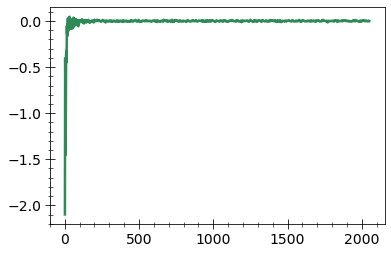

In [45]:

plt.plot(t_years,zg[exp0].differentiate('t')*magn,c='seagreen',label='$z_{g,0}^b$-REF')
#plt.plot(t_years,(zg[exp0]-zg0[exp0]).differentiate('t')*magn,c='orchid',label='$\Delta\; z_{g}^b$-REF')

KN2_convective =ds[exp0]['KN2_convective_gm']*magn
KN2_diffusive = (ds[exp0]['KN2_diffusive_gm']+ds[exp0]['Gh_surf_gm']+ds[exp0]['Gh_hdiff_gm']+ds[exp0]['Gh_qsr_gm'])*magn
C = ds[exp0]['C_gm']*magn

#plt.plot(t_years,(KN2_convective + KN2_diffusive + C + tendency_correction[exp0] - thermobaric_correction[exp0]*magn) , label='Total-REF1', c='k', linestyle='--')
plt.plot(t_years,(KN2_convective + KN2_diffusive + C + tendency_correction[exp0]) , label='Total-REF', c='k')

plt.xscale('log')
# plt.xlim(10,100)
# plt.ylim(-.5,0.05)

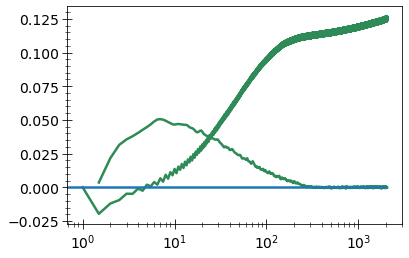

In [28]:
plt.plot(t_years,tendency_correction1[exp0],c='seagreen',label='$z_{g}^b$-REF')
plt.plot(t_years,-thermobaric_correction[exp0]*magn,c='seagreen',label='$z_{g}^b$-REF')
plt.hlines(0,0,2000)
#plt.plot(t_years,zg[exp0].differentiate('t'),c='seagreen',label='$z_{g}^b$-REF')
#plt.plot(t_years,ds[exp0]['KN2_convective_gm']+ds[exp0]['KN2_diffusive_gm']+ds[exp0]['Gh_surf_gm']+ds[exp0]['Gh_hdiff_gm']+ds[exp0]['Gh_qsr_gm']+ds[exp0]['C_gm'],c='seagreen',label='$z_{g}^b$-REF')
plt.xscale('log')

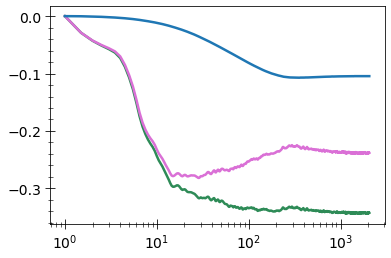

In [17]:
plt.plot(t_years,zg[exp1],c='seagreen',label='$z_{g}^b$-REF')
plt.plot(t_years,(zg[exp1]-zg0[exp1]),c='orchid',label='$\Delta\; z_{g}^b$-REF')
plt.plot(t_years, (thermobaric_correction[exp1]*magn).cumsum('t')/magn*60*60*24*180, label='th')
plt.xscale('log')

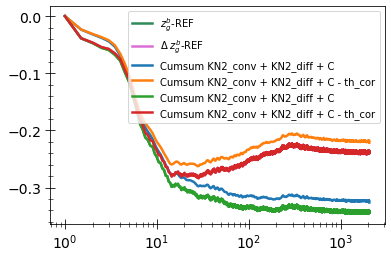

In [29]:

plt.plot(t_years,zg[exp1],c='seagreen',label='$z_{g}^b$-REF')
plt.plot(t_years,(zg[exp1]-zg0[exp1]),c='orchid',label='$\Delta\; z_{g}^b$-REF')
# plt.plot(t_years, (KN2_convective + KN2_diffusive + C ).cumsum('t')/magn*60*60*24*180, label='Cumsum KN2_conv + KN2_diff + C')
# plt.plot(t_years, (KN2_convective + KN2_diffusive + C  - thermobaric_correction[exp1]*magn).cumsum('t')/magn*60*60*24*180, label='Cumsum KN2_conv + KN2_diff + C - th_cor')
plt.plot(t_years, (KN2_convective + KN2_diffusive + C + tendency_correction[exp1]).cumsum('t')/magn*60*60*24*180, label='Cumsum KN2_conv + KN2_diff + C')
plt.plot(t_years, (KN2_convective + KN2_diffusive + C + tendency_correction[exp1] - thermobaric_correction[exp1]*magn).cumsum('t')/magn*60*60*24*180, label='Cumsum KN2_conv + KN2_diff + C - th_cor')
plt.plot(t_years, (KN2_convective + KN2_diffusive + C ).cumsum('t')/magn*60*60*24*180+ tendency_correction1[exp1], label='Cumsum KN2_conv + KN2_diff + C')
plt.plot(t_years, (KN2_convective + KN2_diffusive + C  - thermobaric_correction[exp1]*magn).cumsum('t')/magn*60*60*24*180 + tendency_correction1[exp1], label='Cumsum KN2_conv + KN2_diff + C - th_cor')
plt.legend()
plt.xscale('log')

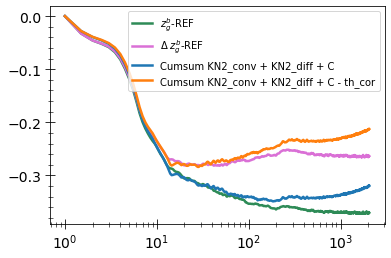

In [19]:
plt.plot(t_years,zg[exp0],c='seagreen',label='$z_{g}^b$-REF')
plt.plot(t_years,(zg[exp0]-zg0[exp0]),c='orchid',label='$\Delta\; z_{g}^b$-REF')
plt.plot(t_years, (KN2_convective + KN2_diffusive + C ).cumsum('t')/magn*60*60*24*180+ tendency_correction[exp0], label='Cumsum KN2_conv + KN2_diff + C')
plt.plot(t_years, (KN2_convective + KN2_diffusive + C  - thermobaric_correction[exp0]*magn).cumsum('t')/magn*60*60*24*180 + tendency_correction[exp0], label='Cumsum KN2_conv + KN2_diff + C - th_cor')
plt.legend()
plt.xscale('log')

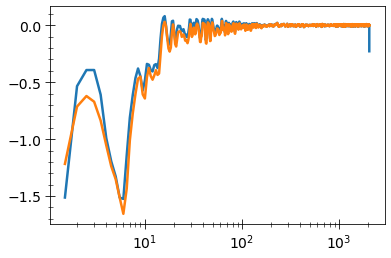

In [36]:
plt.plot(t_years, (KN2_convective + KN2_diffusive + C + tendency_correction[exp1]), label='Cumsum KN2_conv + KN2_diff + C')
plt.plot(t_years, (KN2_convective + KN2_diffusive + C + tendency_correction1[exp1].differentiate('t')), label='Cumsum KN2_conv + KN2_diff + C')
plt.xscale('log')
